In [1]:
!pip install koreanize-matplotlib
!pip install plotly
!pip install ta==0.9.0

## lib

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
import ta
from sklearn.decomposition import PCA

import os
from pylab import plt, mpl
from tqdm import tqdm
from datetime import datetime, timedelta

In [3]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler, ReduceLROnPlateau
from tensorflow.keras.metrics import AUC, Precision

In [4]:
# import ta
# from libs.feature_importance import importance as imp
from sklearn.metrics import classification_report, precision_score, confusion_matrix
from sklearn.feature_selection import SequentialFeatureSelector, RFECV
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import roc_curve, auc
import pickle
import warnings
warnings.filterwarnings('ignore')

plt.style.use('seaborn') # 'seaborn-v0_8' 스타일을 사용 오류
mpl.rcParams['savefig.dpi'] = 300
mpl.rcParams['font.family'] = 'serif'
pd.set_option('display.precision', 4)
np.set_printoptions(suppress=True, precision=4)
os.environ['PYTHONHASHSEED'] = '0'

In [5]:
import koreanize_matplotlib

# 그래프에 retina display 적용
%config InlineBackend.figure_format = 'retina'

#### seaborn 한글 깨짐 현상 해결 방법

In [6]:
# jupyter notebook 내 그래프를 바로 그리기 위한 설정
%matplotlib inline

# unicode minus를 사용하지 않기 위한 설정 (minus 깨짐현상 방지)
plt.rcParams['axes.unicode_minus'] = False

In [7]:
# # 주가데이터
# import FinanceDataReader as fdr
# fdr.__version__

### Seed 설정

In [8]:
import random

# 시드 값 설정
seed_value = 100

# 파이썬 내장 random 모듈 시드 설정
random.seed(seed_value)

# TensorFlow 시드 설정
tf.random.set_seed(seed_value)

# Numpy 시드 설정
np.random.seed(seed_value)

### 데이터 준비

In [9]:
kospi_14_24_01_trend_label_kalman = pd.read_csv('/aiffel/aiffel/fnguide/data/last.csv', index_col=0)
kospi_14_24_01_trend_label_kalman

,Open,High,Low,Close,Volume,MarCap,매도_금융투자,매수_금융투자,순매수_금융투자,매도_보험,...,기관/개인 매도 비율,뉴스심리지수,USDKRW,경제심리지수,경상수지,상품수지,수출금액 (천불),수입금액 (천불),무역수지 (천불),M2(평잔 원계열)
Date,,,,,,,,,,,,,,,,,,,,,
2014-03-07,1979.70,1983.53,1968.66,1974.68,231557237,1171060533144157,3586232,4040200,453968,2641596,...,0.1187,108.18,1063.60,100.9,5679.6,6701.5,4.9064e+07,4.5559e+07,3505717.0,1964954.0
2014-03-10,1967.63,1967.66,1951.96,1954.42,214944284,1159472445620989,4957687,3914211,-1043476,3045944,...,0.1220,105.28,1064.20,100.9,5679.6,6701.5,4.9064e+07,4.5559e+07,3505717.0,1964954.0
2014-03-11,1957.22,1963.87,1951.20,1963.87,247468004,1164815467875309,3837210,4029193,191983,3804816,...,0.1022,103.81,1066.10,100.9,5679.6,6701.5,4.9064e+07,4.5559e+07,3505717.0,1964954.0
2014-03-12,1957.67,1958.09,1930.48,1932.54,329923547,1146460580210853,6588397,7599838,1011441,3966236,...,0.1084,104.68,1064.78,100.9,5679.6,6701.5,4.9064e+07,4.5559e+07,3505717.0,1964954.0
2014-03-13,1940.35,1946.28,1931.75,1934.38,259619849,1147366863530616,5901313,6934734,1033421,2884637,...,0.1195,102.58,1067.03,100.9,5679.6,6701.5,4.9064e+07,4.5559e+07,3505717.0,1964954.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-29,2675.46,2687.44,2665.21,2687.44,470546033,2189691725743463,5353046,10015015,4661969,1479298,...,0.0652,108.39,1377.09,94.5,6361.5,7382.6,5.6572e+07,5.2281e+07,4291164.0,3998706.8
2024-04-30,2693.22,2710.23,2687.29,2692.06,460083516,2193843858061216,6073768,9027473,2953705,1548253,...,0.0851,110.75,1374.64,94.5,6361.5,7382.6,5.6572e+07,5.2281e+07,4291164.0,3998706.8
2024-05-02,2679.04,2692.47,2678.84,2683.65,351087270,2186876849586271,7429768,4868198,-2561570,1366408,...,0.1109,110.86,1375.00,93.8,6361.5,7382.6,5.6572e+07,5.2281e+07,4291164.0,3998706.8


In [10]:
kospi_14_24_01_trend_label_kalman['target'].unique()

array([-1.,  1.])

### Scaling 전 데이터 split

In [11]:
# 학습 및 검증 데이터와 테스트 데이터로 분할
df_train = kospi_14_24_01_trend_label_kalman[kospi_14_24_01_trend_label_kalman.index < '2023-05-01']
df_test = kospi_14_24_01_trend_label_kalman[kospi_14_24_01_trend_label_kalman.index >= '2023-05-01']

In [12]:
df_train

,Open,High,Low,Close,Volume,MarCap,매도_금융투자,매수_금융투자,순매수_금융투자,매도_보험,...,기관/개인 매도 비율,뉴스심리지수,USDKRW,경제심리지수,경상수지,상품수지,수출금액 (천불),수입금액 (천불),무역수지 (천불),M2(평잔 원계열)
Date,,,,,,,,,,,,,,,,,,,,,
2014-03-07,1979.70,1983.53,1968.66,1974.68,231557237,1171060533144157,3586232,4040200,453968,2641596,...,0.1187,108.18,1063.60,100.9,5679.6,6701.5,4.9064e+07,4.5559e+07,3505717.0,1964954.0
2014-03-10,1967.63,1967.66,1951.96,1954.42,214944284,1159472445620989,4957687,3914211,-1043476,3045944,...,0.1220,105.28,1064.20,100.9,5679.6,6701.5,4.9064e+07,4.5559e+07,3505717.0,1964954.0
2014-03-11,1957.22,1963.87,1951.20,1963.87,247468004,1164815467875309,3837210,4029193,191983,3804816,...,0.1022,103.81,1066.10,100.9,5679.6,6701.5,4.9064e+07,4.5559e+07,3505717.0,1964954.0
2014-03-12,1957.67,1958.09,1930.48,1932.54,329923547,1146460580210853,6588397,7599838,1011441,3966236,...,0.1084,104.68,1064.78,100.9,5679.6,6701.5,4.9064e+07,4.5559e+07,3505717.0,1964954.0
2014-03-13,1940.35,1946.28,1931.75,1934.38,259619849,1147366863530616,5901313,6934734,1033421,2884637,...,0.1195,102.58,1067.03,100.9,5679.6,6701.5,4.9064e+07,4.5559e+07,3505717.0,1964954.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-24,2538.36,2541.89,2518.73,2523.50,927191299,1996621732458125,10338951,13755734,3416783,774621,...,0.0464,99.46,1329.38,94.2,2866.3,1232.6,4.9431e+07,5.1940e+07,-2509257.0,3793259.9
2023-04-25,2531.35,2531.35,2472.33,2489.02,886421798,1967147727128900,14057882,13270372,-787510,1056405,...,0.0611,99.26,1332.80,94.2,2866.3,1232.6,4.9431e+07,5.1940e+07,-2509257.0,3793259.9
2023-04-26,2489.49,2498.56,2481.38,2484.83,1089215527,1964553908314712,11861945,10170758,-1691187,1109120,...,0.0418,98.48,1341.00,94.2,2866.3,1232.6,4.9431e+07,5.1940e+07,-2509257.0,3793259.9


In [13]:
df_test

,Open,High,Low,Close,Volume,MarCap,매도_금융투자,매수_금융투자,순매수_금융투자,매도_보험,...,기관/개인 매도 비율,뉴스심리지수,USDKRW,경제심리지수,경상수지,상품수지,수출금액 (천불),수입금액 (천불),무역수지 (천불),M2(평잔 원계열)
Date,,,,,,,,,,,,,,,,,,,,,
2023-05-02,2504.01,2524.42,2503.21,2524.39,701398536,1997496492608915,9416649,13971329,4554680,918678,...,0.0520,93.01,1342.79,94.6,1218.7,1057.7,5.2054e+07,5.4251e+07,-2197000.0,3785013.0
2023-05-03,2510.19,2514.37,2497.83,2501.40,889609358,1979410344840207,11407984,8023058,-3384926,1014087,...,0.0429,93.17,1342.30,94.6,1218.7,1057.7,5.2054e+07,5.4251e+07,-2197000.0,3785013.0
2023-05-04,2494.82,2502.14,2486.09,2500.94,810178245,1978572080421787,16577707,10779894,-5797813,2842450,...,0.0531,92.94,1335.23,94.6,1218.7,1057.7,5.2054e+07,5.4251e+07,-2197000.0,3785013.0
2023-05-08,2518.53,2525.84,2511.13,2513.21,655536077,1989045053273087,6595212,14395063,7799851,1254688,...,0.0439,91.87,1316.96,94.6,1218.7,1057.7,5.2054e+07,5.4251e+07,-2197000.0,3785013.0
2023-05-09,2512.34,2514.81,2495.63,2510.06,751646926,1986578323550486,7504268,8686771,1182503,1073048,...,0.0419,96.59,1322.41,94.6,1218.7,1057.7,5.2054e+07,5.4251e+07,-2197000.0,3785013.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-29,2675.46,2687.44,2665.21,2687.44,470546033,2189691725743463,5353046,10015015,4661969,1479298,...,0.0652,108.39,1377.09,94.5,6361.5,7382.6,5.6572e+07,5.2281e+07,4291164.0,3998706.8
2024-04-30,2693.22,2710.23,2687.29,2692.06,460083516,2193843858061216,6073768,9027473,2953705,1548253,...,0.0851,110.75,1374.64,94.5,6361.5,7382.6,5.6572e+07,5.2281e+07,4291164.0,3998706.8
2024-05-02,2679.04,2692.47,2678.84,2683.65,351087270,2186876849586271,7429768,4868198,-2561570,1366408,...,0.1109,110.86,1375.00,93.8,6361.5,7382.6,5.6572e+07,5.2281e+07,4291164.0,3998706.8


### Train Data Scaling

In [14]:
scaler = RobustScaler() # StandardScaler  RobustScaler
X_features = df_train.columns.values[~(df_train.columns.values == 'target')]
scaled_features = scaler.fit_transform(df_train.loc[:, X_features])
df_train_scaled = pd.DataFrame(scaled_features, index=df_train.index, columns=df_train.loc[:, X_features].columns)
df_train_scaled['target'] = df_train['target']
df_train_scaled

,Open,High,Low,Close,Volume,MarCap,매도_금융투자,매수_금융투자,순매수_금융투자,매도_보험,...,뉴스심리지수,USDKRW,경제심리지수,경상수지,상품수지,수출금액 (천불),수입금액 (천불),무역수지 (천불),M2(평잔 원계열),target
Date,,,,,,,,,,,,,,,,,,,,,
2014-03-07,-0.4666,-0.4730,-0.4641,-0.4725,-0.6616,-0.5339,-0.6351,-0.5345,0.1504,0.6048,...,0.5324,-1.0164,0.5799,-0.2682,-0.2656,0.2296,0.3473,-0.1898,-0.7979,-1.0
2014-03-10,-0.4945,-0.5093,-0.5030,-0.5196,-0.7152,-0.5558,-0.4186,-0.5536,-0.2199,0.9693,...,0.3028,-1.0086,0.5799,-0.2682,-0.2656,0.2296,0.3473,-0.1898,-0.7979,-1.0
2014-03-11,-0.5186,-0.5180,-0.5048,-0.4976,-0.6103,-0.5457,-0.5954,-0.5361,0.0856,1.6533,...,0.1864,-0.9840,0.5799,-0.2682,-0.2656,0.2296,0.3473,-0.1898,-0.7979,-1.0
2014-03-12,-0.5175,-0.5312,-0.5531,-0.5704,-0.3443,-0.5804,-0.1611,0.0072,0.2882,1.7988,...,0.2553,-1.0011,0.5799,-0.2682,-0.2656,0.2296,0.3473,-0.1898,-0.7979,-1.0
2014-03-13,-0.5575,-0.5582,-0.5501,-0.5661,-0.5711,-0.5786,-0.2696,-0.0940,0.2936,0.8239,...,0.0891,-0.9720,0.5799,-0.2682,-0.2656,0.2296,0.3473,-0.1898,-0.7979,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-24,0.8245,0.8045,0.8181,0.8026,1.5824,1.0235,0.4310,0.9440,0.8830,-1.0779,...,-0.1579,2.4268,-0.4164,-1.2989,-1.6664,0.2816,1.0663,-1.4749,1.2581,-1.0
2023-04-25,0.8083,0.7803,0.7100,0.7225,1.4509,0.9679,1.0180,0.8701,-0.1566,-0.8240,...,-0.1738,2.4711,-0.4164,-1.2989,-1.6664,0.2816,1.0663,-1.4749,1.2581,-1.0
2023-04-26,0.7116,0.7053,0.7310,0.7127,2.1051,0.9630,0.6714,0.3984,-0.3801,-0.7764,...,-0.2355,2.5773,-0.4164,-1.2989,-1.6664,0.2816,1.0663,-1.4749,1.2581,-1.0


### Test Data Scaling

In [15]:
scaled_features = scaler.transform(df_test.loc[:, X_features])
df_test_scaled = pd.DataFrame(scaled_features, index=df_test.index, columns=df_test.loc[:, X_features].columns)
df_test_scaled['target'] = df_test['target']
df_test_scaled

,Open,High,Low,Close,Volume,MarCap,매도_금융투자,매수_금융투자,순매수_금융투자,매도_보험,...,뉴스심리지수,USDKRW,경제심리지수,경상수지,상품수지,수출금액 (천불),수입금액 (천불),무역수지 (천불),M2(평잔 원계열),target
Date,,,,,,,,,,,,,,,,,,,,,
2023-05-02,0.7452,0.7645,0.7819,0.8047,0.8540,1.0251,0.2854,0.9768,1.1644,-0.9481,...,-0.6685,2.6005,-0.3569,-1.9025,-1.7111,0.6539,1.3267,-1.4082,1.2488,-1.0
2023-05-03,0.7594,0.7415,0.7694,0.7512,1.4612,0.9910,0.5997,0.0716,-0.7989,-0.8621,...,-0.6558,2.5942,-0.3569,-1.9025,-1.7111,0.6539,1.3267,-1.4082,1.2488,-1.0
2023-05-04,0.7239,0.7135,0.7420,0.7502,1.2050,0.9894,1.4158,0.4911,-1.3955,0.7859,...,-0.6741,2.5026,-0.3569,-1.9025,-1.7111,0.6539,1.3267,-1.4082,1.2488,-1.0
2023-05-08,0.7787,0.7677,0.8004,0.7787,0.7061,1.0092,-0.1601,1.0412,1.9668,-0.6452,...,-0.7588,2.2659,-0.3569,-1.9025,-1.7111,0.6539,1.3267,-1.4082,1.2488,-1.0
2023-05-09,0.7644,0.7425,0.7643,0.7714,1.0161,1.0045,-0.0165,0.1726,0.3305,-0.8090,...,-0.3851,2.3365,-0.3569,-1.9025,-1.7111,0.6539,1.3267,-1.4082,1.2488,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-29,1.1414,1.1375,1.1595,1.1835,0.1093,1.3877,-0.3561,0.3747,1.1909,-0.4428,...,0.5490,3.0449,-0.3717,-0.0184,-0.0912,1.2949,1.1046,-0.0220,1.4892,1.0
2024-04-30,1.1825,1.1896,1.2110,1.1942,0.0756,1.3955,-0.2424,0.2245,0.7685,-0.3806,...,0.7358,3.0132,-0.3717,-0.0184,-0.0912,1.2949,1.1046,-0.0220,1.4892,1.0
2024-05-02,1.1497,1.1490,1.1913,1.1747,-0.2760,1.3824,-0.0283,-0.4085,-0.5953,-0.5445,...,0.7445,3.0178,-0.4758,-0.0184,-0.0912,1.2949,1.1046,-0.0220,1.4892,1.0


### Data Analysis

In [16]:
# 전체 컬럼
df_train_scaled.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'MarCap', '매도_금융투자',
       '매수_금융투자', '순매수_금융투자', '매도_보험',
       ...
       '뉴스심리지수', 'USDKRW', '경제심리지수', '경상수지', '상품수지', '수출금액 (천불)', '수입금액 (천불)',
       '무역수지 (천불)', 'M2(평잔 원계열)', 'target'],
      dtype='object', length=121)

- 생성한 피쳐
['kalman_ma', 'r']

- 순매수 합계 제거된 피쳐

['매도_금융투자', '매수_금융투자', '매도_보험', '매수_보험', '매도_투신', '매수_투신', 
                  '매도_사모', '매수_사모', '매도_은행', '매수_은행', '매도_기타금융', '매수_기타금융', 
                  '매도_연기금 등', '매수_연기금 등', '매도_기타법인', '매수_기타법인', '매도_개인', '매수_개인', 
                  '매도_외국인', '매수_외국인', '매도_기타외국인', '매수_기타외국인', 
                  'Date', 'Open', 'High', 'Low', 'Close']

- 기술적 지표 피쳐

['volume_cmf', 'volume_fi', 'volume_mfi', 'volume_sma_em', 'volume_vpt',
 'volatility_atr', 'volatility_ui', 'trend_macd_diff', 'trend_adx',
 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_aroon_ind',
 'momentum_rsi', 'momentum_wr', 'vol_change_5', 'ret_5', 'vol_change_10',
 'ret_10', 'vol_change_20', 'ret_20', 'std_30', 'vol_std_30']

- 시장 지표

['dowjones', 'nasdaq', 's&p500']

In [17]:
# 타겟값의 비율
df_train_scaled['target'].value_counts(1)

 1.0    0.5511
-1.0    0.4489
Name: target, dtype: float64

In [18]:
# 타겟값의 비율
df_test_scaled['target'].value_counts(1)

 1.0    0.5726
-1.0    0.4274
Name: target, dtype: float64

### Test Set을 제외한 상관관계 분석

In [19]:
df_corr = df_train_scaled.copy()

# target 값을 다음날 값으로 가져온다.
# df_corr['target'] = df_corr['target'].shift(-1)

df_corr.dropna(inplace=True)

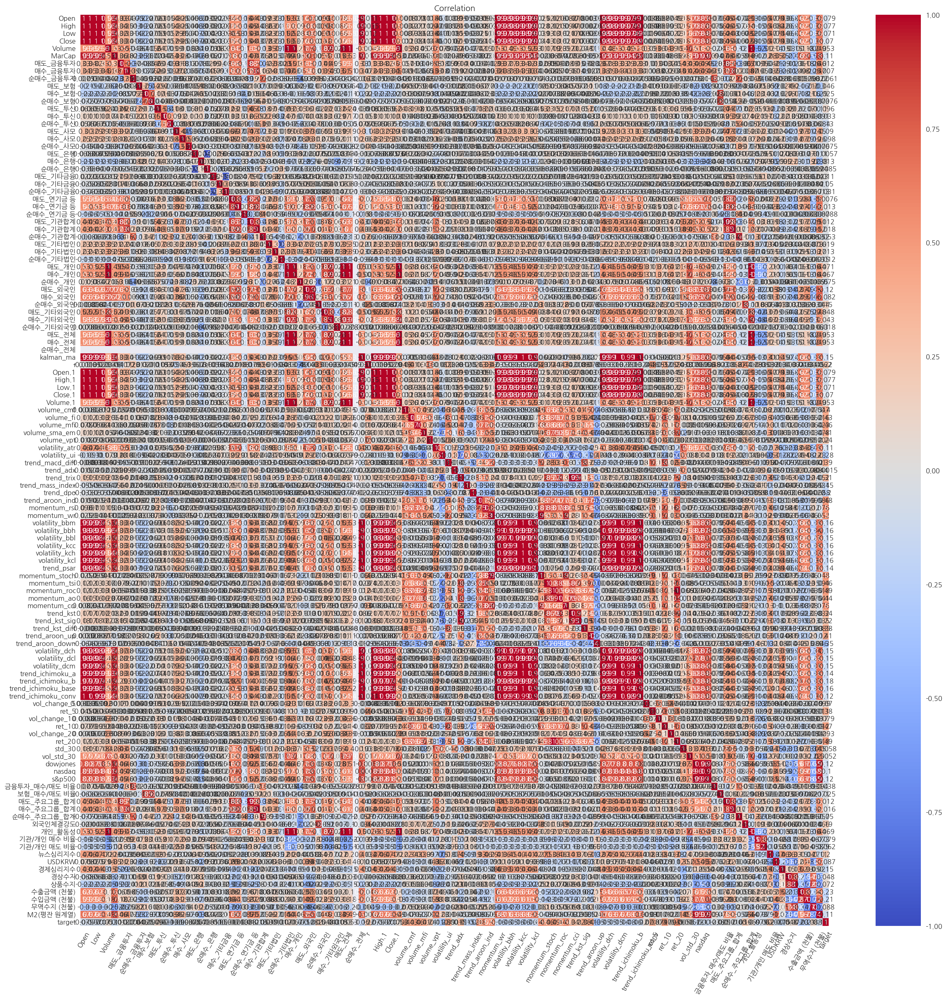

In [20]:
# # 피쳐 선택
# variables = ['transaction_real_price', 'exclusive_use_area', 'floor', 'adjusted_year_of_completion', 'lat', 'long', 'park_min', 'kind_min',
#              'subway_min', 'elem_min']

# 상관관계 행렬 계산
corr = df_corr.corr()

# Heatmap으로 시각화
plt.figure(figsize=(25, 25))
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation')
plt.xticks(rotation=60)  # x 축 눈금값을 45도 기울임

plt.show()

In [21]:
corr['target'].sort_values(ascending = False)[1:].head(20)

momentum_rsi       0.5702
momentum_cci       0.5638
momentum_wr        0.5600
momentum_stoch     0.5477
ret_20             0.4931
momentum_roc       0.4931
trend_aroon_ind    0.4821
ret_10             0.4680
volume_mfi         0.4629
momentum_tsi       0.4619
momentum_ao        0.4436
volume_fi          0.4254
volume_sma_em      0.4115
trend_aroon_up     0.4050
volume_cmf         0.4017
trend_macd_diff    0.3856
ret_5              0.3779
trend_kst_diff     0.3772
trend_kst          0.3356
trend_trix         0.3068
Name: target, dtype: float64

In [22]:
corr['target'].sort_values(ascending = False)[1:].tail(20)

kalman_ma             -0.1451
volatility_dcl        -0.1512
volatility_dch        -0.1525
volatility_dcm        -0.1529
volatility_bbl        -0.1538
trend_mass_index      -0.1543
경제심리지수                -0.1547
volatility_bbm        -0.1576
volatility_bbh        -0.1585
volatility_kch        -0.1587
volatility_kcc        -0.1591
volatility_kcl        -0.1594
trend_ichimoku_base   -0.1635
trend_ichimoku_b      -0.1776
trend_dpo             -0.2004
수입금액 (천불)             -0.2070
수출금액 (천불)             -0.2344
volatility_ui         -0.2759
trend_aroon_down      -0.3470
순매수_전체                    NaN
Name: target, dtype: float64

### Test Set을 제외한 정규화 상호 정보 (Normalized Mutual Information, NMI)

In [23]:
# from sklearn.metrics import normalized_mutual_info_score

# # 정규화 상호 정보 계산
# nmi_matrix = pd.DataFrame(index=df_corr.columns, columns=df_corr.columns)

# for col1 in tqdm(df_corr.columns):
#     for col2 in df_corr.columns:
#         nmi = normalized_mutual_info_score(df_corr[col1], df_corr[col2])
#         nmi_matrix.loc[col1, col2] = nmi

# nmi_matrix = nmi_matrix.astype(float)

# # 시각화
# plt.figure(figsize=(25, 25))
# sns.heatmap(nmi_matrix, annot=True, cmap='viridis', fmt=".2f")
# plt.title('Normalized Mutual Information Matrix')
# plt.show()

In [24]:
# # 'target' 컬럼과 나머지 변수 간의 정규화 상호 정보 계산
# nmi_values = {}

# target_col = 'target'
# for col in tqdm(df_corr.columns):
#     if col != target_col:
#         nmi = normalized_mutual_info_score(df_corr[target_col], df_corr[col])
#         nmi_values[col] = nmi

# # 데이터프레임으로 변환
# nmi_df = pd.DataFrame.from_dict(nmi_values, orient='index', columns=['NMI'])
# nmi_df.sort_values(by='NMI', ascending=False, inplace=True)

# # 시각화
# plt.figure(figsize=(10, 6))
# sns.barplot(x=nmi_df.index, y='NMI', data=nmi_df, palette='viridis')
# plt.title('Normalized Mutual Information with Target')
# plt.xlabel('Features')
# plt.ylabel('NMI')
# plt.xticks(rotation=90)
# plt.show()

## 변수 선택

In [25]:
df_train_scaled.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'MarCap', '매도_금융투자',
       '매수_금융투자', '순매수_금융투자', '매도_보험',
       ...
       '뉴스심리지수', 'USDKRW', '경제심리지수', '경상수지', '상품수지', '수출금액 (천불)', '수입금액 (천불)',
       '무역수지 (천불)', 'M2(평잔 원계열)', 'target'],
      dtype='object', length=121)

In [26]:
# 제거하고 싶은 피쳐
removed_features = [] 

In [27]:
train_data_ = df_train_scaled.copy()
train_data_ = train_data_.drop(columns=removed_features)
train_data_['target'] = train_data_['target'].apply(lambda x: 1 if x > 0 else 0)
train_data_

,Open,High,Low,Close,Volume,MarCap,매도_금융투자,매수_금융투자,순매수_금융투자,매도_보험,...,뉴스심리지수,USDKRW,경제심리지수,경상수지,상품수지,수출금액 (천불),수입금액 (천불),무역수지 (천불),M2(평잔 원계열),target
Date,,,,,,,,,,,,,,,,,,,,,
2014-03-07,-0.4666,-0.4730,-0.4641,-0.4725,-0.6616,-0.5339,-0.6351,-0.5345,0.1504,0.6048,...,0.5324,-1.0164,0.5799,-0.2682,-0.2656,0.2296,0.3473,-0.1898,-0.7979,0
2014-03-10,-0.4945,-0.5093,-0.5030,-0.5196,-0.7152,-0.5558,-0.4186,-0.5536,-0.2199,0.9693,...,0.3028,-1.0086,0.5799,-0.2682,-0.2656,0.2296,0.3473,-0.1898,-0.7979,0
2014-03-11,-0.5186,-0.5180,-0.5048,-0.4976,-0.6103,-0.5457,-0.5954,-0.5361,0.0856,1.6533,...,0.1864,-0.9840,0.5799,-0.2682,-0.2656,0.2296,0.3473,-0.1898,-0.7979,0
2014-03-12,-0.5175,-0.5312,-0.5531,-0.5704,-0.3443,-0.5804,-0.1611,0.0072,0.2882,1.7988,...,0.2553,-1.0011,0.5799,-0.2682,-0.2656,0.2296,0.3473,-0.1898,-0.7979,0
2014-03-13,-0.5575,-0.5582,-0.5501,-0.5661,-0.5711,-0.5786,-0.2696,-0.0940,0.2936,0.8239,...,0.0891,-0.9720,0.5799,-0.2682,-0.2656,0.2296,0.3473,-0.1898,-0.7979,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-24,0.8245,0.8045,0.8181,0.8026,1.5824,1.0235,0.4310,0.9440,0.8830,-1.0779,...,-0.1579,2.4268,-0.4164,-1.2989,-1.6664,0.2816,1.0663,-1.4749,1.2581,0
2023-04-25,0.8083,0.7803,0.7100,0.7225,1.4509,0.9679,1.0180,0.8701,-0.1566,-0.8240,...,-0.1738,2.4711,-0.4164,-1.2989,-1.6664,0.2816,1.0663,-1.4749,1.2581,0
2023-04-26,0.7116,0.7053,0.7310,0.7127,2.1051,0.9630,0.6714,0.3984,-0.3801,-0.7764,...,-0.2355,2.5773,-0.4164,-1.2989,-1.6664,0.2816,1.0663,-1.4749,1.2581,0


In [28]:
test_data_ = df_test_scaled.copy()
test_data_ = test_data_.drop(columns=removed_features)
test_data_['target'] = test_data_['target'].apply(lambda x: 1 if x > 0 else 0)
test_data_

,Open,High,Low,Close,Volume,MarCap,매도_금융투자,매수_금융투자,순매수_금융투자,매도_보험,...,뉴스심리지수,USDKRW,경제심리지수,경상수지,상품수지,수출금액 (천불),수입금액 (천불),무역수지 (천불),M2(평잔 원계열),target
Date,,,,,,,,,,,,,,,,,,,,,
2023-05-02,0.7452,0.7645,0.7819,0.8047,0.8540,1.0251,0.2854,0.9768,1.1644,-0.9481,...,-0.6685,2.6005,-0.3569,-1.9025,-1.7111,0.6539,1.3267,-1.4082,1.2488,0
2023-05-03,0.7594,0.7415,0.7694,0.7512,1.4612,0.9910,0.5997,0.0716,-0.7989,-0.8621,...,-0.6558,2.5942,-0.3569,-1.9025,-1.7111,0.6539,1.3267,-1.4082,1.2488,0
2023-05-04,0.7239,0.7135,0.7420,0.7502,1.2050,0.9894,1.4158,0.4911,-1.3955,0.7859,...,-0.6741,2.5026,-0.3569,-1.9025,-1.7111,0.6539,1.3267,-1.4082,1.2488,0
2023-05-08,0.7787,0.7677,0.8004,0.7787,0.7061,1.0092,-0.1601,1.0412,1.9668,-0.6452,...,-0.7588,2.2659,-0.3569,-1.9025,-1.7111,0.6539,1.3267,-1.4082,1.2488,0
2023-05-09,0.7644,0.7425,0.7643,0.7714,1.0161,1.0045,-0.0165,0.1726,0.3305,-0.8090,...,-0.3851,2.3365,-0.3569,-1.9025,-1.7111,0.6539,1.3267,-1.4082,1.2488,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-29,1.1414,1.1375,1.1595,1.1835,0.1093,1.3877,-0.3561,0.3747,1.1909,-0.4428,...,0.5490,3.0449,-0.3717,-0.0184,-0.0912,1.2949,1.1046,-0.0220,1.4892,1
2024-04-30,1.1825,1.1896,1.2110,1.1942,0.0756,1.3955,-0.2424,0.2245,0.7685,-0.3806,...,0.7358,3.0132,-0.3717,-0.0184,-0.0912,1.2949,1.1046,-0.0220,1.4892,1
2024-05-02,1.1497,1.1490,1.1913,1.1747,-0.2760,1.3824,-0.0283,-0.4085,-0.5953,-0.5445,...,0.7445,3.0178,-0.4758,-0.0184,-0.0912,1.2949,1.1046,-0.0220,1.4892,1


In [29]:
from scipy.stats import ttest_ind

# t-test를 사용하여 피처의 p-value 계산
p_values = {}
for column in X_features:
    feature = train_data_[column]
    group1 = feature[train_data_['target'] == 0]
    group2 = feature[train_data_['target'] == 1]
    t_stat, p_val = ttest_ind(group1, group2)
    p_values[column] = p_val

# p-value 출력
print("Feature p-values:")
for feature, p_val in p_values.items():
    print(f"{feature}: {p_val}")

# 임계값 설정 (예: 0.05)
alpha = 0.05

# 유의미한 피처 선택
selected_features = [feature for feature, p_val in p_values.items() if p_val < alpha]
print("Selected features based on p-value:")
print(selected_features)

# 선택된 피처만 사용하도록 데이터 업데이트
df_train_selected = df_train_scaled[selected_features + ['target']]
df_test_selected = df_test_scaled[selected_features + ['target']]

Feature p-values:
Open: 0.0001859563923398696
High: 0.0002706415707066482
Low: 0.0007020174581479304
Close: 0.0009208001837766173
Volume: 0.012292998810613147
MarCap: 2.2129011516296994e-07
매도_금융투자: 0.580063696379876
매수_금융투자: 0.741254548940072
순매수_금융투자: 0.7729013209723856
매도_보험: 0.02777756689017747
매수_보험: 0.23044908857507215
순매수_보험: 0.7174428249832163
매도_투신: 4.564043017111094e-06
매수_투신: 0.11557389403016542
순매수_투신: 6.594669099430463e-10
매도_사모: 1.770811383587577e-05
매수_사모: 3.2701206413805317e-06
순매수_사모: 0.7218935460465052
매도_은행: 0.7879992109180151
매수_은행: 0.537201713276426
순매수_은행: 0.6865557686374297
매도_기타금융: 0.6146301308583759
매수_기타금융: 0.017471816392415677
순매수_기타금융: 0.13867891296690268
매도_연기금 등: 0.7190844773398644
매수_연기금 등: 0.5341120929824832
순매수_연기금 등: 0.6765441480795799
매도_기관합계: 0.5654818997999821
매수_기관합계: 0.4051509354555817
순매수_기관합계: 0.01263813618050735
매도_기타법인: 0.3652028506732856
매수_기타법인: 0.5341063844938355
순매수_기타법인: 0.5552110652262363
매도_개인: 0.0007175681839350584
매수_개인: 0.00138697810

## 2. 시퀀스 데이터 생성

### 학습 및 검증 데이터와 테스트 데이터로 분할

In [30]:
def create_sequences(data, sequence_length):
    sequences = []
    labels = []
    for i in range(len(data) - sequence_length):
        sequence = data.iloc[i:i + sequence_length].drop(columns=['target']).values
        
        # 다음날 추세 label 예측
        #label = data.iloc[i + sequence_length]['target']
        
        # 현재 시점 추세 label 예측
        label = data.iloc[i + sequence_length - 1]['target']
        
        sequences.append(sequence)
        labels.append(label)
    
    return np.array(sequences), np.array(labels)

In [31]:
sequence_length = 20  # 시퀀스 길이

# 학습 및 검증 데이터 시퀀스 생성
train_val_sequences = []
train_val_labels = []

X_train_val, y_train_val = create_sequences(train_data_, sequence_length)

In [32]:
X_train_val.shape, y_train_val.shape

((2232, 20, 120), (2232,))

In [33]:
X_test, y_test = create_sequences(test_data_, sequence_length)
X_test.shape, y_test.shape

((228, 20, 120), (228,))

In [34]:
train_val_split = int(len(X_train_val)*0.8)
train_val_split

1785

In [35]:
y_train_val_int = y_train_val[:train_val_split].astype(int)
y_test_int = y_test.astype(int)

In [36]:
# 학습 데이터 0 / 1 비율
np.bincount(y_train_val_int)

array([ 709, 1076])

In [37]:
# 테스트 데이터 0 / 1 비율
np.bincount(y_test_int)

array([ 99, 129])

In [38]:
105 + 118

223

## 3. LSTM 모델 구성 및 학습

In [39]:
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV, cross_val_score
from sklearn.ensemble import BaggingClassifier
from keras.wrappers.scikit_learn import KerasClassifier
from keras.regularizers import l1, l2
from tensorflow.keras import callbacks
import random
#from scikeras.wrappers import KerasClassifier 오류 발생 (optree)

## 실험

In [40]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '5'

In [41]:
def cw(df):
    c0, c1 = np.bincount(df.astype(int))
    w0 = (1 / c0) * (len(df)) / 2
    w1 = (1 / c1) * (len(df)) / 2
    return {0: w0, 1: w1}

In [42]:
optimizer = Adam(learning_rate=0.001)

In [43]:
def create_deep_rnn_model(layer='SimpleRNN', optimizer='adam', 
                          features=1, seed=100):
    
    if layer == 'SimpleRNN':
        layer = SimpleRNN
    else:
        layer = LSTM
        
    model = Sequential()
    model.add(layer(units=64, return_sequences=True, input_shape=(sequence_length, features)))
    model.add(Dropout(0.2))
    model.add(layer(units=32, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(units=16, activation='relu'))
    model.add(Dense(units=8, activation='relu'))
    model.add(Dense(units=4, activation='relu'))
    model.add(Dense(units=1, activation='sigmoid'))
    
    model.compile(optimizer=optimizer, loss='binary_crossentropy', 
                  metrics=['binary_accuracy', AUC()])
    return model

In [44]:
# TimeSeriesSplit 설정
tscv = TimeSeriesSplit(n_splits=9)

# 교차 검증 결과를 저장할 리스트
results = []

# 교차 검증
for train_index, test_index in tscv.split(X_train_val):
    X_train_cv, X_test_cv = X_train_val[train_index], X_train_val[test_index]
    y_train_cv, y_test_cv = y_train_val[train_index], y_train_val[test_index]
    
    #early_stopping_cb = callbacks.EarlyStopping(patience=10, monitor='binary_accuracy', restore_best_weights=True)
    
    model = create_deep_rnn_model(layer='LSTM', optimizer='adam', features=X_train_val.shape[2])
    model.fit(X_train_cv, y_train_cv, epochs=10, batch_size=16, verbose=1)#, class_weight=cw(y_train_cv)) #, callbacks=[early_stopping_cb])
    
    # 모델 평가
    loss = model.evaluate(X_test_cv, y_test_cv, verbose=1)
    results.append(loss[-2:])
    print(f'Test Loss: {loss}')

Epoch 1/10
15/15 [==============================] - 5s 7ms/step - loss: 0.6613 - binary_accuracy: 0.5822 - auc: 0.6996
Epoch 2/10
15/15 [==============================] - 0s 7ms/step - loss: 0.5909 - binary_accuracy: 0.5956 - auc: 0.8743
Epoch 3/10
15/15 [==============================] - 0s 7ms/step - loss: 0.5122 - binary_accuracy: 0.5956 - auc: 0.9278
Epoch 4/10
15/15 [==============================] - 0s 6ms/step - loss: 0.4873 - binary_accuracy: 0.6267 - auc: 0.8899
Epoch 5/10
15/15 [==============================] - 0s 7ms/step - loss: 0.4243 - binary_accuracy: 0.7911 - auc: 0.9289
Epoch 6/10
15/15 [==============================] - 0s 6ms/step - loss: 0.3920 - binary_accuracy: 0.8178 - auc: 0.9440
Epoch 7/10
15/15 [==============================] - 0s 6ms/step - loss: 0.3419 - binary_accuracy: 0.9022 - auc: 0.9871
Epoch 8/10
15/15 [==============================] - 0s 6ms/step - loss: 0.3256 - binary_accuracy: 0.9378 - auc: 0.9819
Epoch 9/10
15/15 [==============================

In [45]:
results

[[0.6591928005218506, 0.6561293005943298],
 [0.5381165742874146, 0.5380556583404541],
 [0.4035874307155609, 0.45967021584510803],
 [0.5022421479225159, 0.4243835210800171],
 [0.6233183741569519, 0.6547147035598755],
 [0.35426008701324463, 0.6903871297836304],
 [0.3766816258430481, 0.5802996158599854],
 [0.25112107396125793, 0.5677278637886047],
 [0.7085201740264893, 0.7537842392921448]]

In [46]:
val_mu = np.mean(results, axis=0)[0]
val_mu

0.4907822542720371

In [47]:
val_std = np.std(results, axis=0, ddof=1)[0]
val_std

0.1550835573324234

### 홀드아웃 샘플(Test Set)에 대한 예측 성능 평가 방식은 질문으로

In [48]:
model = create_deep_rnn_model(layer='LSTM', optimizer='adam', features=X_train_val.shape[2])

model.fit(X_train_val, y_train_val, epochs=10, batch_size=16, verbose=1)#, class_weight=cw(y_train_val))

Epoch 1/10
140/140 [==============================] - 3s 6ms/step - loss: 0.5456 - binary_accuracy: 0.7151 - auc_9: 0.8075
Epoch 2/10
140/140 [==============================] - 1s 6ms/step - loss: 0.3465 - binary_accuracy: 0.8486 - auc_9: 0.9263
Epoch 3/10
140/140 [==============================] - 1s 6ms/step - loss: 0.2555 - binary_accuracy: 0.8938 - auc_9: 0.9604
Epoch 4/10
140/140 [==============================] - 1s 7ms/step - loss: 0.2114 - binary_accuracy: 0.9117 - auc_9: 0.9725
Epoch 5/10
140/140 [==============================] - 1s 6ms/step - loss: 0.1916 - binary_accuracy: 0.9189 - auc_9: 0.9770
Epoch 6/10
140/140 [==============================] - 1s 6ms/step - loss: 0.1659 - binary_accuracy: 0.9292 - auc_9: 0.9823
Epoch 7/10
140/140 [==============================] - 1s 7ms/step - loss: 0.1318 - binary_accuracy: 0.9494 - auc_9: 0.9895
Epoch 8/10
140/140 [==============================] - 1s 7ms/step - loss: 0.1348 - binary_accuracy: 0.9467 - auc_9: 0.9887
Epoch 9/10
140/1

In [49]:
evl = model.evaluate(X_test, y_test, verbose=1)
evl

8/8 [==============================] - 1s 4ms/step - loss: 1.1959 - binary_accuracy: 0.5833 - auc_9: 0.7521


[1.1958866119384766, 0.5833333134651184, 0.7521336674690247]

In [50]:
(evl[1] - val_mu) / val_std

0.5967818947736481

In [51]:
len(y_test)

228

In [52]:
test = df_test.iloc[-len(y_test):]
test['target'].apply(lambda x: 1 if x > 0 else 0)
test['target'] = test['target'].apply(lambda x: 1 if x > 0 else 0)
backtest_df = pd.DataFrame(index=test.index)
backtest_df['p'] = model.predict(X_test)
backtest_df['p'] = (backtest_df['p'] > 0.5).astype(int)

In [53]:
# 예측값 비율
backtest_df['p'].value_counts()

0    160
1     68
Name: p, dtype: int64

In [54]:
# 실제 타겟값의 비율
test['target'].value_counts()

1    129
0     99
Name: target, dtype: int64

              precision    recall  f1-score   support

           0       0.51      0.83      0.63        99
           1       0.75      0.40      0.52       129

    accuracy                           0.58       228
   macro avg       0.63      0.61      0.58       228
weighted avg       0.65      0.58      0.57       228



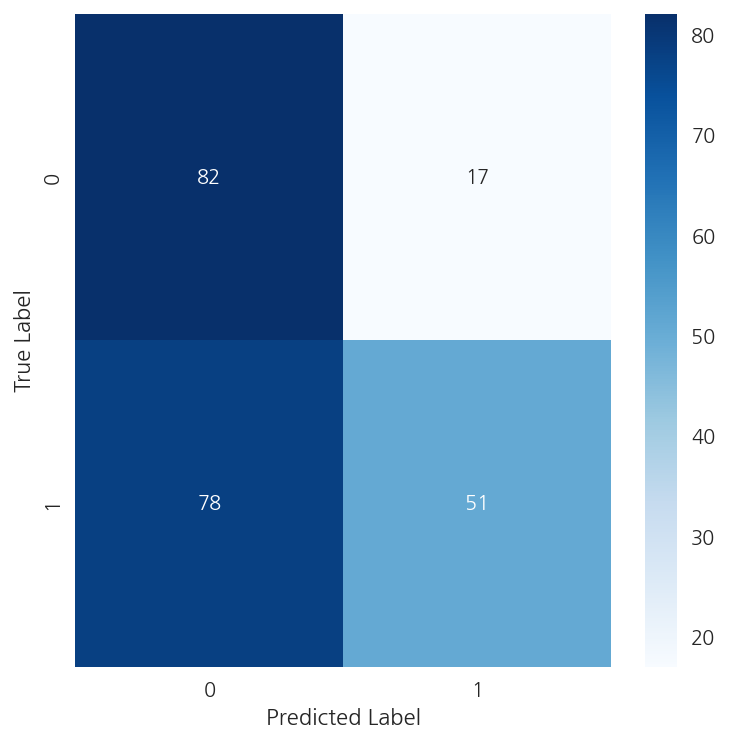

In [55]:
from sklearn.metrics import classification_report
import seaborn as sns
from sklearn.metrics import confusion_matrix

# 1. 분류 보고서 확인
print(classification_report(test['target'], backtest_df['p']))

# 2. 히트맵 시각화
plt.figure(figsize=(6, 6))
cm2 = confusion_matrix(test['target'], backtest_df['p'])
sns.heatmap(cm2, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

### 표본 외 경제적 성능 평가

In [56]:
# 매매 포지션 진입, 변경, 청산이 발생한 시점 횟수
sum(backtest_df['p'].diff() != 0) + 1

12

In [57]:
# 포지션 변경에 따른 증권사 수수료 / 거래세
pc = (0.00015 * 2  + 0.0018)

# 슬리피지 적용
sp = 0.001

In [58]:
backtest_df['p'] = np.where(backtest_df['p'] == 0, -1, 1)
backtest_df['r'] = df_test.loc[test.index]['r']
backtest_df['s'] = backtest_df['p'] * backtest_df['r']
backtest_df['s_'] = np.where(backtest_df['p'].diff() != 0,
                      backtest_df['s'] - pc - sp, backtest_df['s'])
backtest_df['s_'].iloc[0] -= pc
backtest_df['s_'].iloc[-1] -= pc
backtest_df

,p,r,s,s_
Date,,,,
2023-06-01,-1,-3.0896e-03,3.0896e-03,-2.1104e-03
2023-06-02,-1,1.2451e-02,-1.2451e-02,-1.2451e-02
2023-06-05,-1,5.3865e-03,-5.3865e-03,-5.3865e-03
2023-06-07,-1,7.2644e-05,-7.2644e-05,-7.2644e-05
2023-06-08,-1,-1.8177e-03,1.8177e-03,1.8177e-03
...,...,...,...,...
2024-04-29,-1,1.1644e-02,-1.1644e-02,-1.1644e-02
2024-04-30,-1,1.7176e-03,-1.7176e-03,-1.7176e-03
2024-05-02,-1,-3.1289e-03,3.1289e-03,3.1289e-03


In [59]:
backtest_df[['r', 's', 's_']].sum().apply(np.exp)

r     1.0610
s     0.9867
s_    0.9496
dtype: float64

In [60]:
backtest_df[['r', 's', 's_']].sum().apply(np.exp) - 1

r     0.0610
s    -0.0133
s_   -0.0504
dtype: float64

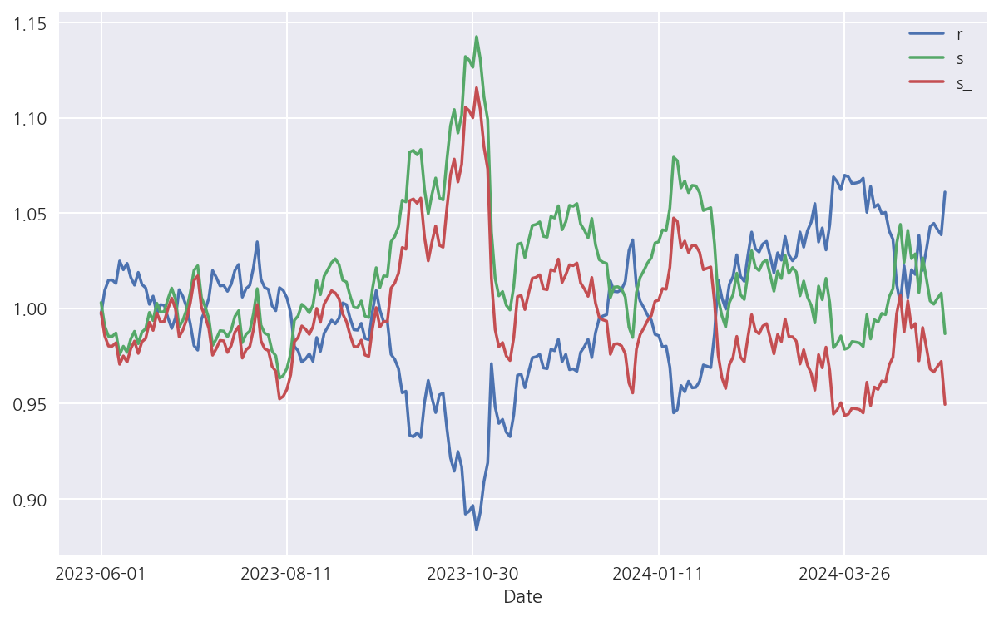

In [61]:
backtest_df[['r', 's', 's_']].cumsum().apply(np.exp).plot(figsize=(10, 6));

### 예측 추세

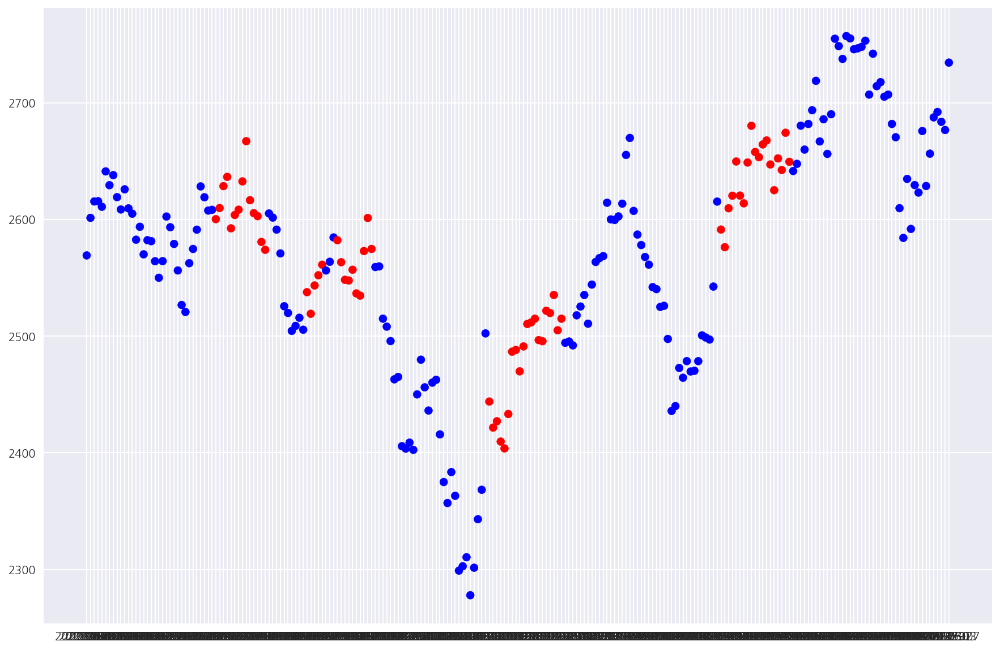

In [62]:
sub_data = df_test['Close'].loc[backtest_df['p'].index]
c_sig = backtest_df['p']
c_sig['color'] = np.where(c_sig == 1, 'red', 'blue')

fig, ax = plt.subplots(1, 1, figsize=(15, 10))
ax.scatter(sub_data.index, sub_data.values,
              c=c_sig['color'])

### 실제 추세

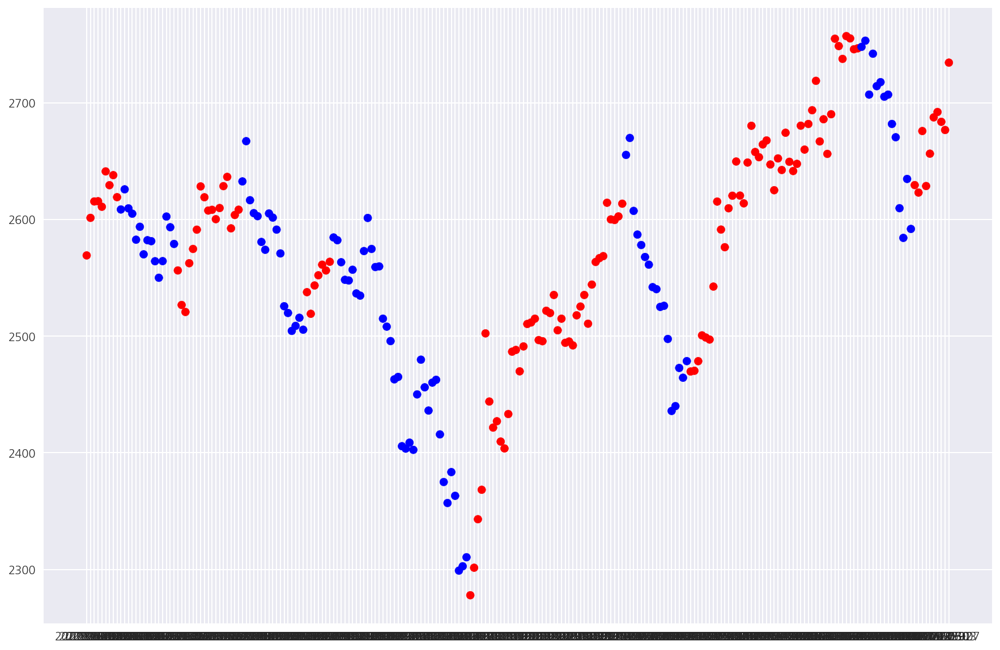

In [63]:
sub_data = df_test['Close'].loc[backtest_df['p'].index]
c_sig = df_test['target'].loc[backtest_df['p'].index]
c_sig['color'] = np.where(c_sig == 1, 'red', 'blue')

fig, ax = plt.subplots(1, 1, figsize=(15, 10))
ax.scatter(sub_data.index, sub_data.values,
              c=c_sig['color'])

### 메모
1. epoch 15 / 20 / 25 에 따라 성능이 달라진다.

### Blocked Cross Validation

In [64]:
def block_cross_validation(X, y, n_blocks):
    
    block_size = len(X) // n_blocks
    results = []

    for i in range(n_blocks):
        test_index = np.arange(i * block_size, (i + 1) * block_size)
        train_index = np.setdiff1d(np.arange(len(X)), test_index)
        
        X_train_cv, X_test_cv = X[train_index], X[test_index]
        y_train_cv, y_test_cv = y[train_index], y[test_index]

        model = create_deep_rnn_model(layer='LSTM', optimizer='adam', features=X_train_val.shape[2])
        model.fit(X_train_cv, y_train_cv, epochs=10, batch_size=16, verbose=1)#, class_weight=cw(y_train_cv)) #, callbacks=[early_stopping_cb])
        
        # 모델 평가
        loss = model.evaluate(X_test_cv, y_test_cv, verbose=1)
        results.append(loss[-2:])
        
        print(f'Block {i+1} Test Accuracy : {loss[-2:]}')

    return results, block_size

n_blocks = 9
results, block_size = block_cross_validation(X_train_val, y_train_val, n_blocks)

Epoch 1/10
124/124 [==============================] - 3s 6ms/step - loss: 0.5905 - binary_accuracy: 0.7263 - auc_10: 0.7797
Epoch 2/10
124/124 [==============================] - 1s 5ms/step - loss: 0.3883 - binary_accuracy: 0.8327 - auc_10: 0.9066
Epoch 3/10
124/124 [==============================] - 1s 5ms/step - loss: 0.2776 - binary_accuracy: 0.8810 - auc_10: 0.9527
Epoch 4/10
124/124 [==============================] - 1s 5ms/step - loss: 0.2474 - binary_accuracy: 0.8911 - auc_10: 0.9618
Epoch 5/10
124/124 [==============================] - 1s 6ms/step - loss: 0.1886 - binary_accuracy: 0.9204 - auc_10: 0.9789
Epoch 6/10
124/124 [==============================] - 1s 5ms/step - loss: 0.1881 - binary_accuracy: 0.9163 - auc_10: 0.9785
Epoch 7/10
124/124 [==============================] - 1s 5ms/step - loss: 0.1702 - binary_accuracy: 0.9264 - auc_10: 0.9824
Epoch 8/10
124/124 [==============================] - 1s 6ms/step - loss: 0.1464 - binary_accuracy: 0.9370 - auc_10: 0.9869
Epoch 9/

In [65]:
results

[[0.5120967626571655, 0.4154476225376129],
 [0.7137096524238586, 0.6994858980178833],
 [0.5725806355476379, 0.40678733587265015],
 [0.44354838132858276, 0.5472753047943115],
 [0.44758063554763794, 0.6973366737365723],
 [0.6774193644523621, 0.7804774641990662],
 [0.47983869910240173, 0.619948148727417],
 [0.5040322542190552, 0.40944498777389526],
 [0.6854838728904724, 0.7355895042419434]]

In [66]:
val_mu = np.mean(results, axis=0)[0]
val_mu

0.5595878064632416

In [67]:
val_std = np.std(results, axis=0, ddof=1)[0]
val_std

0.10686963196098725

### 홀드아웃 샘플(Test Set)에 대한 예측 성능 평가 방식은 질문으로

In [68]:
X_blocked = X_train_val[-block_size:]
y_blocked = y_train_val[-block_size:]

In [69]:
X_blocked.shape, y_blocked.shape

((248, 20, 120), (248,))

In [70]:
model = create_deep_rnn_model(layer='LSTM', optimizer='adam', features=X_train_val.shape[2])

model.fit(X_blocked, y_blocked, epochs=10, batch_size=16, verbose=1)#, class_weight=cw(y_train_val))

Epoch 1/10
16/16 [==============================] - 3s 7ms/step - loss: 0.6016 - binary_accuracy: 0.7500 - auc_19: 0.8237
Epoch 2/10
16/16 [==============================] - 0s 7ms/step - loss: 0.3555 - binary_accuracy: 0.8790 - auc_19: 0.9274
Epoch 3/10
16/16 [==============================] - 0s 7ms/step - loss: 0.2088 - binary_accuracy: 0.9355 - auc_19: 0.9608
Epoch 4/10
16/16 [==============================] - 0s 6ms/step - loss: 0.1740 - binary_accuracy: 0.9395 - auc_19: 0.9765
Epoch 5/10
16/16 [==============================] - 0s 6ms/step - loss: 0.1712 - binary_accuracy: 0.9274 - auc_19: 0.9869
Epoch 6/10
16/16 [==============================] - 0s 6ms/step - loss: 0.2123 - binary_accuracy: 0.9113 - auc_19: 0.9747
Epoch 7/10
16/16 [==============================] - 0s 6ms/step - loss: 0.1605 - binary_accuracy: 0.9274 - auc_19: 0.9884
Epoch 8/10
16/16 [==============================] - 0s 6ms/step - loss: 0.1211 - binary_accuracy: 0.9677 - auc_19: 0.9886
Epoch 9/10
16/16 [======

In [71]:
evl = model.evaluate(X_test, y_test, verbose=1)
evl

8/8 [==============================] - 1s 4ms/step - loss: 1.6057 - binary_accuracy: 0.5746 - auc_19: 0.7385


[1.6056913137435913, 0.5745614171028137, 0.7385482788085938]

In [72]:
(evl[1] - val_mu) / val_std

0.14011099659291668

In [73]:
len(y_test)

228

In [74]:
test = df_test.iloc[-len(y_test):]
test['target'].apply(lambda x: 1 if x > 0 else 0)
test['target'] = test['target'].apply(lambda x: 1 if x > 0 else 0)
backtest_df = pd.DataFrame(index=test.index)
backtest_df['p'] = model.predict(X_test)
backtest_df['p'] = (backtest_df['p'] > 0.5).astype(int)

In [75]:
# 예측값 비율
backtest_df['p'].value_counts()

0    196
1     32
Name: p, dtype: int64

In [76]:
# 실제 타겟값의 비율
test['target'].value_counts()

1    129
0     99
Name: target, dtype: int64

              precision    recall  f1-score   support

           0       0.51      1.00      0.67        99
           1       1.00      0.25      0.40       129

    accuracy                           0.57       228
   macro avg       0.75      0.62      0.53       228
weighted avg       0.79      0.57      0.52       228



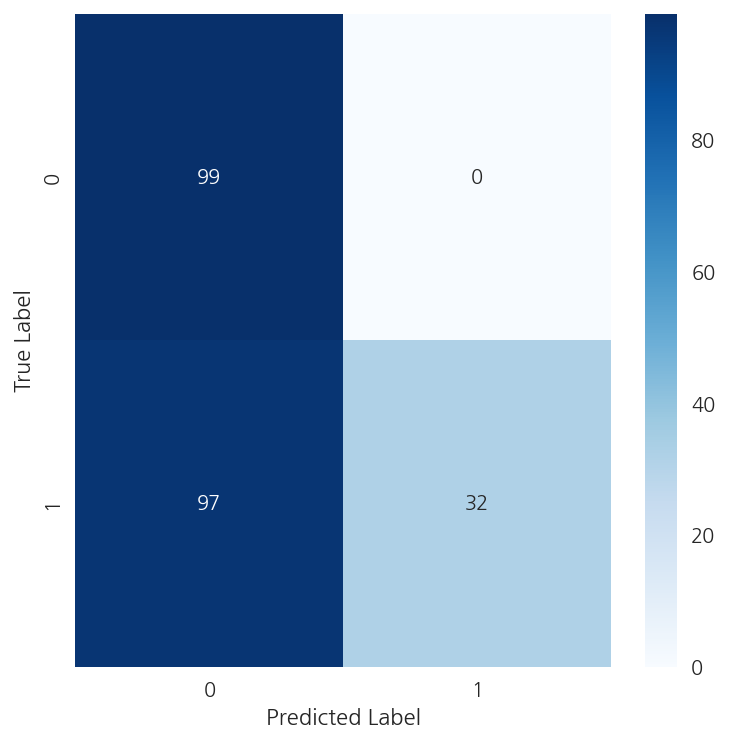

In [77]:
from sklearn.metrics import classification_report
import seaborn as sns
from sklearn.metrics import confusion_matrix

# 1. 분류 보고서 확인
print(classification_report(test['target'], backtest_df['p']))

# 2. 히트맵 시각화
plt.figure(figsize=(6, 6))
cm2 = confusion_matrix(test['target'], backtest_df['p'])
sns.heatmap(cm2, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

### 표본 외 경제적 성능 평가

In [78]:
# 매매 포지션 진입, 변경, 청산이 발생한 시점 횟수
sum(backtest_df['p'].diff() != 0) + 1

6

In [79]:
# 포지션 변경에 따른 증권사 수수료 / 거래세
pc = (0.00015 * 2  + 0.0018)

# 슬리피지 적용
sp = 0.001

In [80]:
backtest_df['p'] = np.where(backtest_df['p'] == 0, -1, 1)
backtest_df['r'] = df_test.loc[test.index]['r']
backtest_df['s'] = backtest_df['p'] * backtest_df['r']
backtest_df['s_'] = np.where(backtest_df['p'].diff() != 0,
                      backtest_df['s'] - pc - sp, backtest_df['s'])
backtest_df['s_'].iloc[0] -= pc
backtest_df['s_'].iloc[-1] -= pc
backtest_df

,p,r,s,s_
Date,,,,
2023-06-01,-1,-3.0896e-03,3.0896e-03,-2.1104e-03
2023-06-02,-1,1.2451e-02,-1.2451e-02,-1.2451e-02
2023-06-05,-1,5.3865e-03,-5.3865e-03,-5.3865e-03
2023-06-07,-1,7.2644e-05,-7.2644e-05,-7.2644e-05
2023-06-08,-1,-1.8177e-03,1.8177e-03,1.8177e-03
...,...,...,...,...
2024-04-29,-1,1.1644e-02,-1.1644e-02,-1.1644e-02
2024-04-30,-1,1.7176e-03,-1.7176e-03,-1.7176e-03
2024-05-02,-1,-3.1289e-03,3.1289e-03,3.1289e-03


In [81]:
backtest_df[['r', 's', 's_']].sum().apply(np.exp)

r     1.0610
s     1.0667
s_    1.0459
dtype: float64

In [82]:
backtest_df[['r', 's', 's_']].sum().apply(np.exp) - 1

r     0.0610
s     0.0667
s_    0.0459
dtype: float64

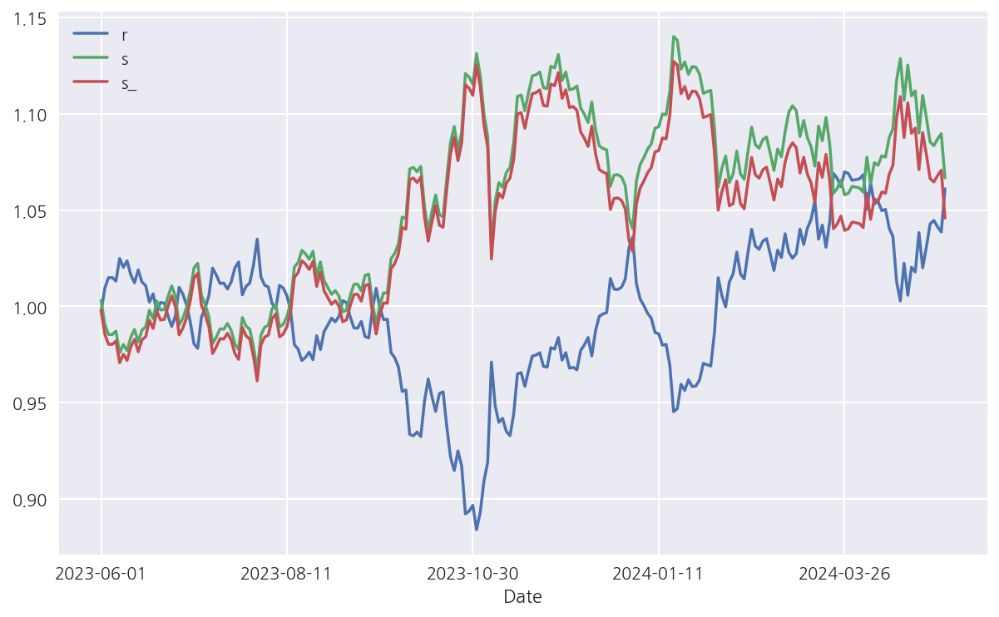

In [83]:
backtest_df[['r', 's', 's_']].cumsum().apply(np.exp).plot(figsize=(10, 6));

### 예측 추세

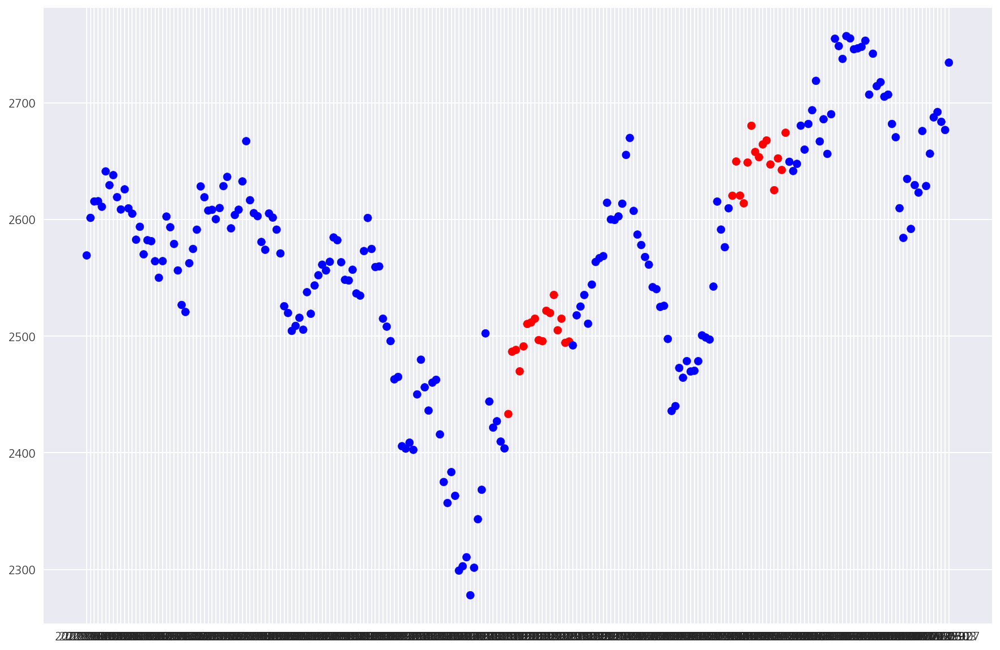

In [84]:
sub_data = df_test['Close'].loc[backtest_df['p'].index]
c_sig = backtest_df['p']
c_sig['color'] = np.where(c_sig == 1, 'red', 'blue')

fig, ax = plt.subplots(1, 1, figsize=(15, 10))
ax.scatter(sub_data.index, sub_data.values,
              c=c_sig['color'])

### 실제 추세

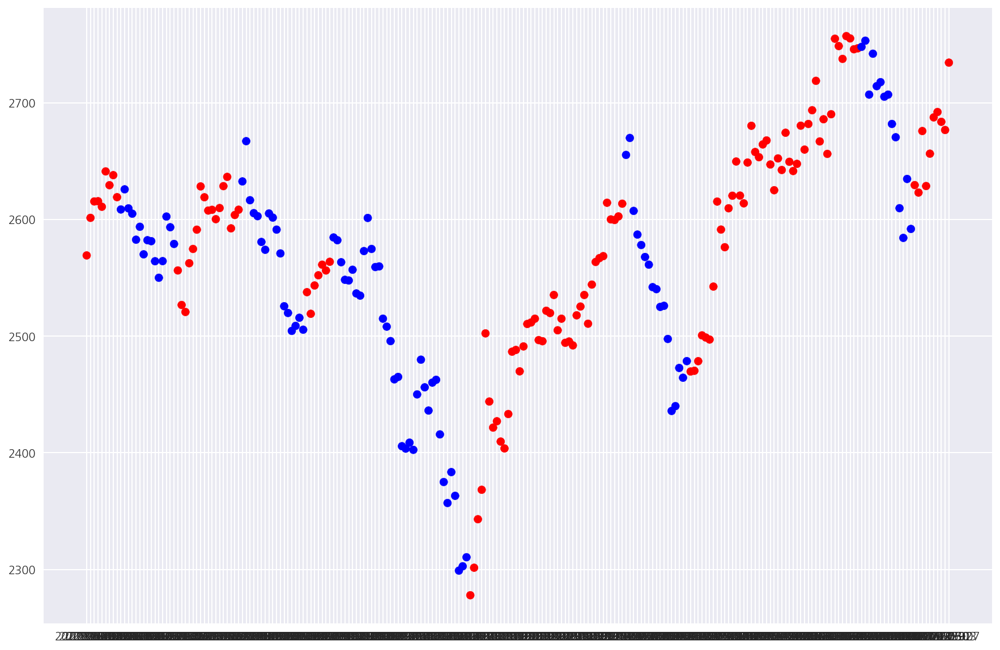

In [85]:
sub_data = df_test['Close'].loc[backtest_df['p'].index]
c_sig = df_test['target'].loc[backtest_df['p'].index]
c_sig['color'] = np.where(c_sig == 1, 'red', 'blue')

fig, ax = plt.subplots(1, 1, figsize=(15, 10))
ax.scatter(sub_data.index, sub_data.values,
              c=c_sig['color'])

### Advanced B CV

In [86]:
# def block_cross_validation(X, y, test_block_size, train_block_factor, n_splits):
    
#     results = []

#     for i in range(n_splits):
#         test_start = i * test_block_size
#         test_end = test_start + test_block_size
        
#         train_start = max(0, test_start - train_block_factor * test_block_size)
#         train_end = test_start
        
#         X_train_cv, X_test_cv = X[train_start:train_end], X[test_start:test_end]
#         y_train_cv, y_test_cv = y[train_start:train_end], y[test_start:test_end]

#         if len(X_train_cv) == 0 or len(X_test_cv) == 0:
#             continue

            
            
#         set_seeds()
#         model = create_deep_rnn_model(layer='LSTM', optimizer='adam', features=X_train_val.shape[2])
#         model.fit(X_train_cv, y_train_cv, epochs=20, batch_size=16, verbose=1)#, class_weight=cw(y_train_cv)) #, callbacks=[early_stopping_cb])
        
#         # 모델 평가
#         loss = model.evaluate(X_test_cv, y_test_cv, verbose=1)
#         results.append(loss[-2:])
        
#         print(f'Block {i} Test Accuracy : {loss[-2:]}')
        
#     return results

# # 테스트 블록 크기, 훈련 블록의 배수, 스플릿 수 설정
# test_block_size = 250
# train_block_factor = 4
# n_splits = 9

# results = block_cross_validation(X_train_val, y_train_val, test_block_size, train_block_factor, n_splits)

In [87]:
# 테스트 블록 크기, 훈련 블록의 배수, 스플릿 수 설정
test_block_size = 250
train_block_factor = 4
n_splits = 9

    
results = []
for i in range(n_splits):
    test_start = i * test_block_size
    test_end = test_start + test_block_size
    
    train_start = max(0, test_start - train_block_factor * test_block_size)
    train_end = test_start
    
    X_train_cv, X_test_cv = X_train_val[train_start:train_end], X_train_val[test_start:test_end]
    y_train_cv, y_test_cv = y_train_val[train_start:train_end], y_train_val[test_start:test_end]
    if len(X_train_cv) == 0 or len(X_test_cv) != test_block_size:
        continue
        
        
    model = create_deep_rnn_model(layer='LSTM', optimizer='adam', features=X_train_val.shape[2])
    model.fit(X_train_cv, y_train_cv, epochs=10, batch_size=16, verbose=1)#, class_weight=cw(y_train_cv)) #, callbacks=[early_stopping_cb])
    
    # 모델 평가
    loss = model.evaluate(X_test_cv, y_test_cv, verbose=1)
    results.append(loss[-2:])
    
    print(f'Block {i} Test Accuracy : {loss[-2:]}')

Epoch 1/10
16/16 [==============================] - 3s 7ms/step - loss: 0.6401 - binary_accuracy: 0.7200 - auc_20: 0.6986
Epoch 2/10
16/16 [==============================] - 0s 7ms/step - loss: 0.5352 - binary_accuracy: 0.8000 - auc_20: 0.8568
Epoch 3/10
16/16 [==============================] - 0s 7ms/step - loss: 0.3822 - binary_accuracy: 0.8680 - auc_20: 0.9582
Epoch 4/10
16/16 [==============================] - 0s 6ms/step - loss: 0.2508 - binary_accuracy: 0.9120 - auc_20: 0.9781
Epoch 5/10
16/16 [==============================] - 0s 7ms/step - loss: 0.2435 - binary_accuracy: 0.8840 - auc_20: 0.9643
Epoch 6/10
16/16 [==============================] - 0s 6ms/step - loss: 0.1941 - binary_accuracy: 0.9400 - auc_20: 0.9819
Epoch 7/10
16/16 [==============================] - 0s 7ms/step - loss: 0.2213 - binary_accuracy: 0.9200 - auc_20: 0.9680
Epoch 8/10
16/16 [==============================] - 0s 7ms/step - loss: 0.1464 - binary_accuracy: 0.9520 - auc_20: 0.9916
Epoch 9/10
16/16 [======

In [88]:
test_start, test_end 

(2000, 2250)

In [89]:
train_start, train_end

(1000, 2000)

In [90]:
len(X_train_cv), len(X_test_cv)

(1000, 232)

In [91]:
results

[[0.699999988079071, 0.7413991689682007],
 [0.6320000290870667, 0.5585495233535767],
 [0.5320000052452087, 0.6928698420524597],
 [0.3840000033378601, 0.5144118070602417],
 [0.6520000100135803, 0.78150874376297],
 [0.36399999260902405, 0.6061262488365173],
 [0.47200000286102295, 0.6142322421073914]]

In [92]:
val_mu = np.mean(results, axis=0)[0]
val_mu

0.5337142901761192

In [93]:
val_std = np.std(results, axis=0, ddof=1)[0]
val_std

0.13312364793155315

### 홀드아웃 샘플(Test Set)에 대한 예측 성능 평가 방식은 질문으로

In [94]:
X_blocked = X_train_val[-test_block_size* train_block_factor:]
y_blocked = y_train_val[-test_block_size* train_block_factor:]

In [95]:
X_blocked.shape, y_blocked.shape

((1000, 20, 120), (1000,))

In [96]:
model = create_deep_rnn_model(layer='LSTM', optimizer='adam', features=X_train_val.shape[2])

model.fit(X_blocked, y_blocked, epochs=10, batch_size=16, verbose=1)#, class_weight=cw(y_train_val))

Epoch 1/10
63/63 [==============================] - 3s 6ms/step - loss: 0.5794 - binary_accuracy: 0.6920 - auc_27: 0.8125
Epoch 2/10
63/63 [==============================] - 0s 6ms/step - loss: 0.4707 - binary_accuracy: 0.8350 - auc_27: 0.8665
Epoch 3/10
63/63 [==============================] - 0s 6ms/step - loss: 0.4230 - binary_accuracy: 0.8540 - auc_27: 0.8855
Epoch 4/10
63/63 [==============================] - 0s 6ms/step - loss: 0.3279 - binary_accuracy: 0.8710 - auc_27: 0.9171
Epoch 5/10
63/63 [==============================] - 0s 6ms/step - loss: 0.2411 - binary_accuracy: 0.9050 - auc_27: 0.9590
Epoch 6/10
63/63 [==============================] - 0s 6ms/step - loss: 0.2188 - binary_accuracy: 0.9130 - auc_27: 0.9685
Epoch 7/10
63/63 [==============================] - 0s 7ms/step - loss: 0.1954 - binary_accuracy: 0.9170 - auc_27: 0.9752
Epoch 8/10
63/63 [==============================] - 0s 7ms/step - loss: 0.1374 - binary_accuracy: 0.9460 - auc_27: 0.9882
Epoch 9/10
63/63 [======

In [97]:
evl = model.evaluate(X_test, y_test, verbose=1)
evl

8/8 [==============================] - 1s 4ms/step - loss: 1.2157 - binary_accuracy: 0.6140 - auc_27: 0.6617


[1.215742588043213, 0.6140350699424744, 0.6616944670677185]

In [98]:
(evl[1] - val_mu) / val_std

0.6033547083058671

In [99]:
len(y_test)

228

In [100]:
test = df_test.iloc[-len(y_test):]
test['target'].apply(lambda x: 1 if x > 0 else 0)
test['target'] = test['target'].apply(lambda x: 1 if x > 0 else 0)
backtest_df = pd.DataFrame(index=test.index)
backtest_df['p'] = model.predict(X_test)
backtest_df['p'] = (backtest_df['p'] > 0.5).astype(int)

In [101]:
# 예측값 비율
backtest_df['p'].value_counts()

0    167
1     61
Name: p, dtype: int64

In [102]:
# 실제 타겟값의 비율
test['target'].value_counts()

1    129
0     99
Name: target, dtype: int64

              precision    recall  f1-score   support

           0       0.51      0.87      0.65        99
           1       0.79      0.37      0.51       129

    accuracy                           0.59       228
   macro avg       0.65      0.62      0.58       228
weighted avg       0.67      0.59      0.57       228



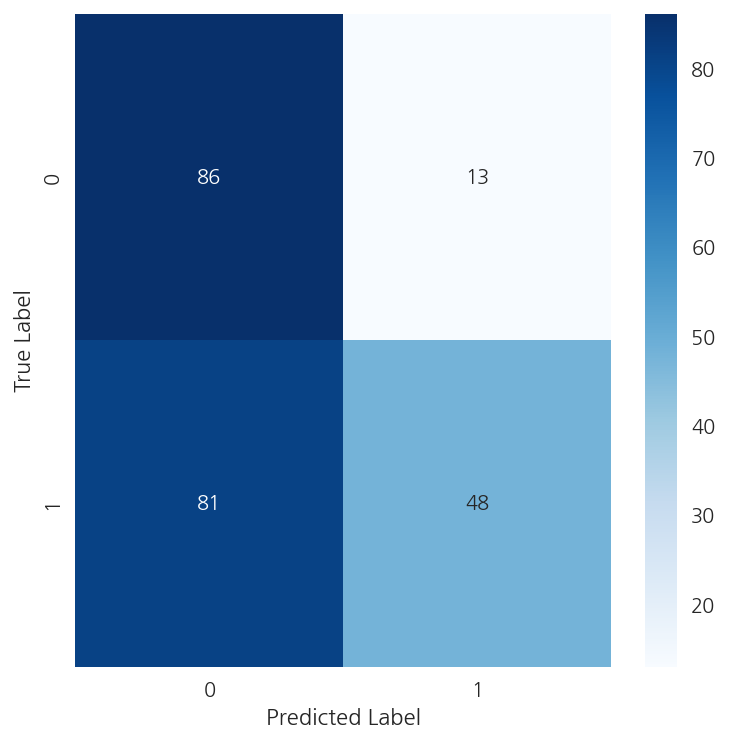

In [103]:
from sklearn.metrics import classification_report
import seaborn as sns
from sklearn.metrics import confusion_matrix

# 1. 분류 보고서 확인
print(classification_report(test['target'], backtest_df['p']))

# 2. 히트맵 시각화
plt.figure(figsize=(6, 6))
cm2 = confusion_matrix(test['target'], backtest_df['p'])
sns.heatmap(cm2, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

### 표본 외 경제적 성능 평가

In [104]:
# 매매 포지션 진입, 변경, 청산이 발생한 시점 횟수
sum(backtest_df['p'].diff() != 0) + 1

18

In [105]:
# 포지션 변경에 따른 증권사 수수료 / 거래세
pc = (0.00015 * 2  + 0.0018)

# 슬리피지 적용
sp = 0.001

In [106]:
backtest_df['p'] = np.where(backtest_df['p'] == 0, -1, 1)
backtest_df['r'] = df_test.loc[test.index]['r']
backtest_df['s'] = backtest_df['p'] * backtest_df['r']
backtest_df['s_'] = np.where(backtest_df['p'].diff() != 0,
                      backtest_df['s'] - pc - sp, backtest_df['s'])
backtest_df['s_'].iloc[0] -= pc
backtest_df['s_'].iloc[-1] -= pc
backtest_df

,p,r,s,s_
Date,,,,
2023-06-01,-1,-3.0896e-03,3.0896e-03,-2.1104e-03
2023-06-02,-1,1.2451e-02,-1.2451e-02,-1.2451e-02
2023-06-05,-1,5.3865e-03,-5.3865e-03,-5.3865e-03
2023-06-07,-1,7.2644e-05,-7.2644e-05,-7.2644e-05
2023-06-08,-1,-1.8177e-03,1.8177e-03,1.8177e-03
...,...,...,...,...
2024-04-29,-1,1.1644e-02,-1.1644e-02,-1.1644e-02
2024-04-30,-1,1.7176e-03,-1.7176e-03,-1.7176e-03
2024-05-02,-1,-3.1289e-03,3.1289e-03,3.1289e-03


In [107]:
backtest_df[['r', 's', 's_']].sum().apply(np.exp)

r     1.0610
s     0.9209
s_    0.8700
dtype: float64

In [108]:
backtest_df[['r', 's', 's_']].sum().apply(np.exp) - 1

r     0.0610
s    -0.0791
s_   -0.1300
dtype: float64

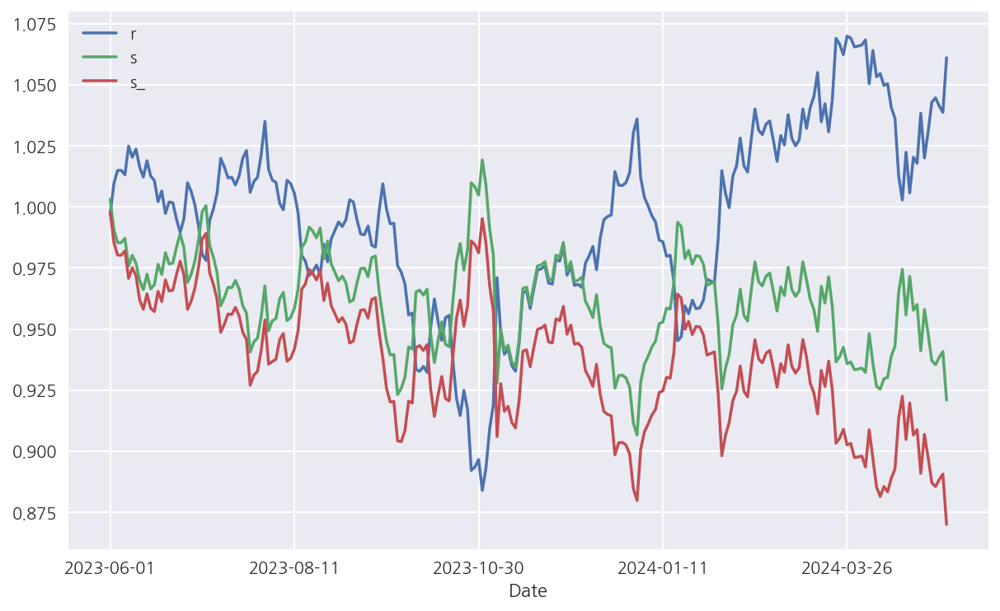

In [109]:
backtest_df[['r', 's', 's_']].cumsum().apply(np.exp).plot(figsize=(10, 6));

### 예측 추세

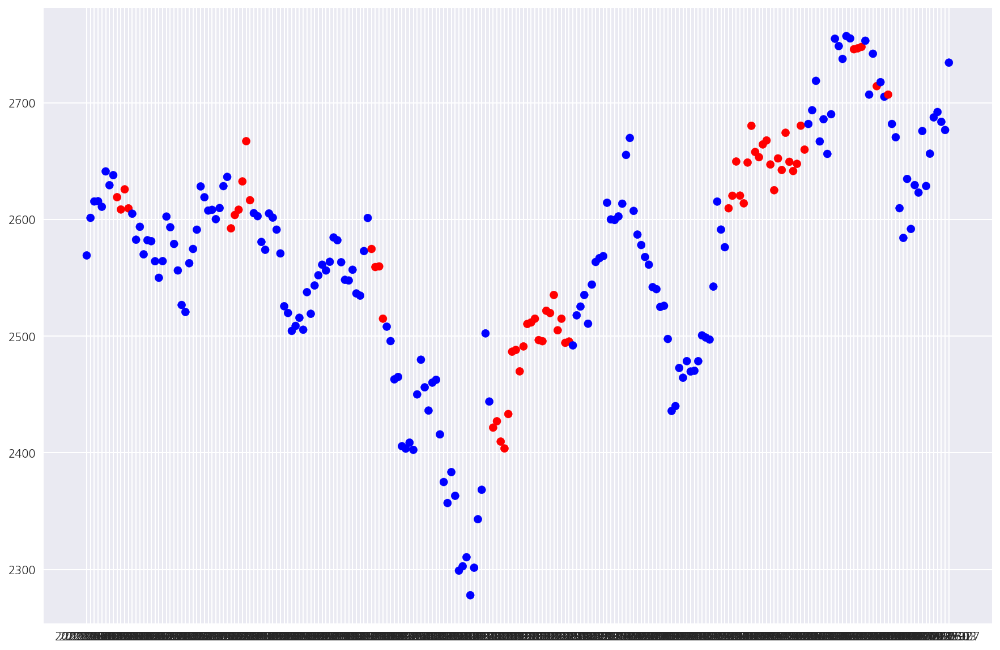

In [110]:
sub_data = df_test['Close'].loc[backtest_df['p'].index]
c_sig = backtest_df['p']
c_sig['color'] = np.where(c_sig == 1, 'red', 'blue')

fig, ax = plt.subplots(1, 1, figsize=(15, 10))
ax.scatter(sub_data.index, sub_data.values,
              c=c_sig['color'])

### 실제 추세

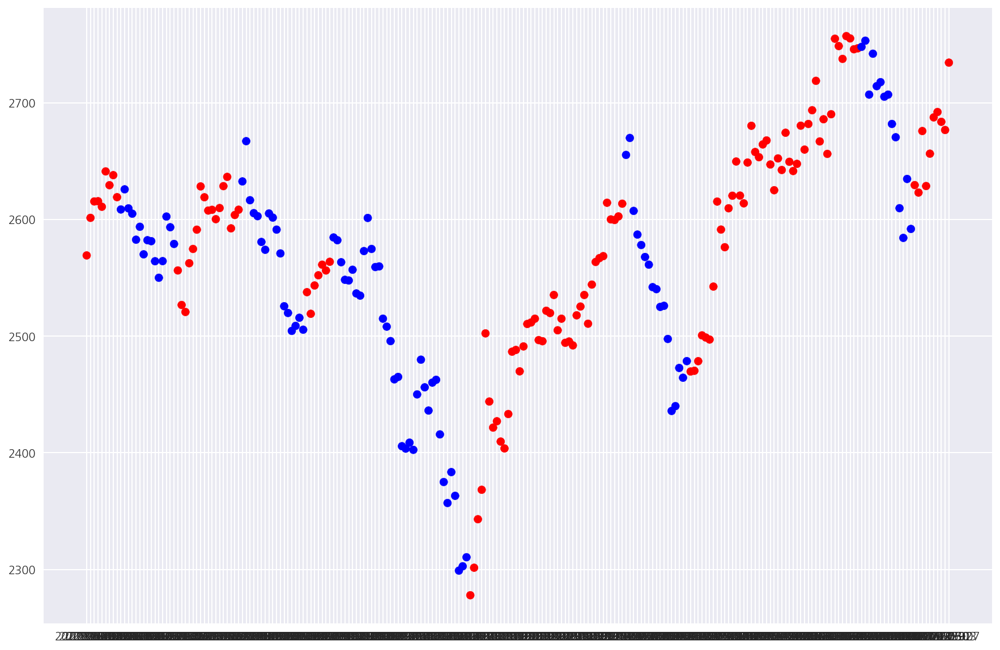

In [111]:
sub_data = df_test['Close'].loc[backtest_df['p'].index]
c_sig = df_test['target'].loc[backtest_df['p'].index]
c_sig['color'] = np.where(c_sig == 1, 'red', 'blue')

fig, ax = plt.subplots(1, 1, figsize=(15, 10))
ax.scatter(sub_data.index, sub_data.values,
              c=c_sig['color'])